In [16]:
#import necessary libraries
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10
from keras.preprocessing import image
import keras.backend as K
import matplotlib.pyplot as plt
import numpy as np
import time
from tqdm import tqdm

In [17]:
# for the dataset, we will first declare some global variables
batch_size = 16
epoch_count = 50
noise_dim = 100
n_class = 10
tags = ['Airplane', 'Automobile', 'Bird', 'Cat', 'Deer', 'Dog', 'Frog', 'Horse', 'Ship', 'Truck']
img_size = 32

In [18]:
# Load the dataset
(X_train, y_train), (_, _) = cifar10.load_data()

# Normalize the data
X_train = (X_train - 127.5) / 127.5

# Create tf.data.Dataset
dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
dataset = dataset.shuffle(buffer_size=1000).batch(batch_size)


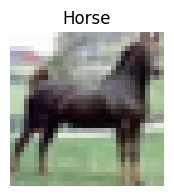

In [19]:
import keras.utils as image
# plotting a random image from the dataset
plt.figure(figsize=(2,2))
idx = np.random.randint(0,len(X_train))
img = image.array_to_img(X_train[idx], scale=True)
plt.imshow(img)
plt.axis('off')
plt.title(tags[y_train[idx][0]])
plt.show()


In [20]:

# Define Loss function for Classification between Real and Fake
bce_loss = tf.keras.losses.BinaryCrossentropy()


In [21]:

# Discriminator Loss
def discriminator_loss(real, fake):
	real_loss = bce_loss(tf.ones_like(real), real)
	fake_loss = bce_loss(tf.zeros_like(fake), fake)
	total_loss = real_loss + fake_loss
	return total_loss

# Generator Loss
def generator_loss(preds):
	return bce_loss(tf.ones_like(preds), preds)

# Optimiser for both Generator and Dsicriminator 
d_optimizer=Adam(learning_rate=0.0002, beta_1 = 0.5)
g_optimizer=Adam(learning_rate=0.0002, beta_1 = 0.5)

In [22]:
def build_generator():

# label input
	in_label = tf.keras.layers.Input(shape=(1,))

	# create an embedding layer for all the 10 classes in the form of a vector 
	# of size 50
	li = tf.keras.layers.Embedding(n_class, 50)(in_label)

	n_nodes = 8 * 8
	li = tf.keras.layers.Dense(n_nodes)(li)
	# reshape the layer
	li = tf.keras.layers.Reshape((8, 8, 1))(li)

	# image generator input
	in_lat = tf.keras.layers.Input(shape=(noise_dim,))

	n_nodes = 128 * 8 * 8
	gen = tf.keras.layers.Dense(n_nodes)(in_lat)
	gen = tf.keras.layers.LeakyReLU(alpha=0.2)(gen)
	gen = tf.keras.layers.Reshape((8, 8, 128))(gen)

	# merge image gen and label input
	merge = tf.keras.layers.Concatenate()([gen, li])

	gen = tf.keras.layers.Conv2DTranspose(
		128, (4, 4), strides=(2, 2), padding='same')(merge) # 16x16x128
	gen = tf.keras.layers.LeakyReLU(alpha=0.2)(gen)

	gen = tf.keras.layers.Conv2DTranspose(
		128, (4, 4), strides=(2, 2), padding='same')(gen) # 32x32x128
	gen = tf.keras.layers.LeakyReLU(alpha=0.2)(gen)

	out_layer = tf.keras.layers.Conv2D(
		3, (8, 8), activation='tanh', padding='same')(gen) # 32x32x3

	model = Model([in_lat, in_label], out_layer)
	return model


g_model = build_generator()
g_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 100)]        0           []                               
                                                                                                  
 input_5 (InputLayer)           [(None, 1)]          0           []                               
                                                                                                  
 dense_5 (Dense)                (None, 8192)         827392      ['input_6[0][0]']                
                                                                                                  
 embedding_2 (Embedding)        (None, 1, 50)        500         ['input_5[0][0]']                
                                                                                            

In [23]:
def build_discriminator():
    # label input
    in_label = tf.keras.layers.Input(shape=(1,))
    #This vector of size 50 will be learnt by the discriminator
    li = tf.keras.layers.Embedding(n_class, 50)(in_label)
    
    n_nodes = img_size * img_size 
    li = tf.keras.layers.Dense(n_nodes)(li) 
    
    li = tf.keras.layers.Reshape((img_size, img_size, 1))(li) 
    
    
    # image input
    in_image = tf.keras.layers.Input(shape=(img_size, img_size, 3)) 
    
    merge = tf.keras.layers.Concatenate()([in_image, li]) 
    
    
    #We will combine input label with input image and supply as inputs to the model. 
    fe = tf.keras.layers.Conv2D(128, (3,3), strides=(2,2), padding='same')(merge) 
    fe = tf.keras.layers.LeakyReLU(alpha=0.2)(fe)
    
    fe = tf.keras.layers.Conv2D(128, (3,3), strides=(2,2), padding='same')(fe) 
    fe = tf.keras.layers.LeakyReLU(alpha=0.2)(fe)
    
    fe = tf.keras.layers.Flatten()(fe) 
    
    fe = tf.keras.layers.Dropout(0.4)(fe)
    
    out_layer = tf.keras.layers.Dense(1, activation='sigmoid')(fe)
    
    # define model the model. 
    model = Model([in_image, in_label], out_layer)
    	
    return model


d_model = build_discriminator()
d_model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 1)]          0           []                               
                                                                                                  
 embedding_3 (Embedding)        (None, 1, 50)        500         ['input_7[0][0]']                
                                                                                                  
 dense_6 (Dense)                (None, 1, 1024)      52224       ['embedding_3[0][0]']            
                                                                                                  
 input_8 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                            

In [24]:
# Compiles the train_step function into a callable TensorFlow graph
@tf.function
def train_step(dataset):
	
	real_images, real_labels = dataset
	# Sample random points in the latent space and concatenate the labels.
	random_latent_vectors = tf.random.normal(shape=(batch_size, noise_dim))
	generated_images = g_model([random_latent_vectors, real_labels])

	# Train the discriminator.
	with tf.GradientTape() as tape:
		pred_fake = d_model([generated_images, real_labels])
		pred_real = d_model([real_images, real_labels])
		
		d_loss = discriminator_loss(pred_real, pred_fake)
	
	grads = tape.gradient(d_loss, d_model.trainable_variables)
	# print(grads)
	d_optimizer.apply_gradients(zip(grads, d_model.trainable_variables))

	#-----------------------------------------------------------------#
	
	# Sample random points in the latent space.
	random_latent_vectors = tf.random.normal(shape=(batch_size, noise_dim))
	
	# Train the generator
	with tf.GradientTape() as tape:
		fake_images = g_model([random_latent_vectors, real_labels])
		predictions = d_model([fake_images, real_labels])
		g_loss = generator_loss(predictions)
	
	grads = tape.gradient(g_loss, g_model.trainable_variables)
	g_optimizer.apply_gradients(zip(grads, g_model.trainable_variables))
	
	return d_loss, g_loss

In [25]:
# Helper function to plot generated images
def show_samples(num_samples, n_class, g_model):
    fig, axes = plt.subplots(10,num_samples, figsize=(10,20)) 
    fig.tight_layout()
    fig.subplots_adjust(wspace=None, hspace=0.2)
 
    for l in np.arange(10):
      random_noise = tf.random.normal(shape=(num_samples, noise_dim))
      label = tf.ones(num_samples)*l
      gen_imgs = g_model.predict([random_noise, label])
      for j in range(gen_imgs.shape[0]):
        img = image.array_to_img(gen_imgs[j], scale=True)
        axes[l,j].imshow(img)
        axes[l,j].yaxis.set_ticks([])
        axes[l,j].xaxis.set_ticks([])
 
        if j ==0:
          axes[l,j].set_ylabel(tags[l])
    plt.show()

Epoch:  50


100%|██████████| 3125/3125 [03:36<00:00, 14.46it/s]


1/1 [==============================] - 0s 52ms/step


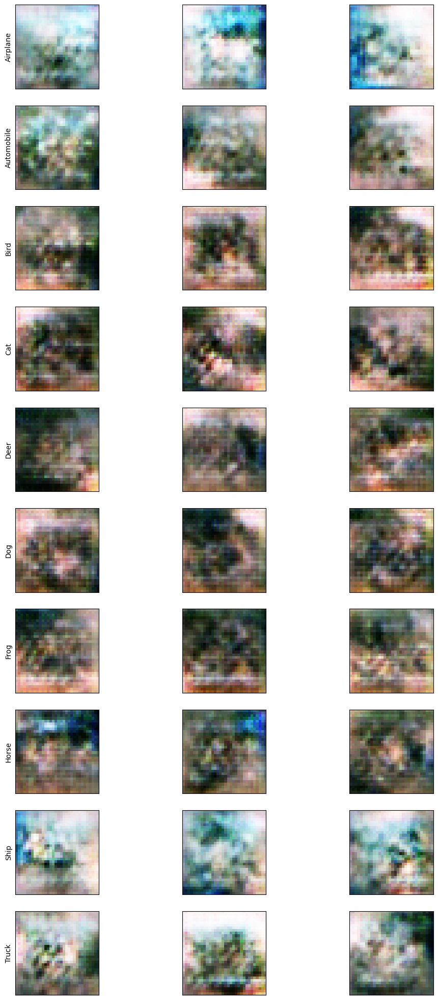

Epoch: 0 -- Generator Loss: 0.899653434753418, Discriminator Loss: 1.2874703407287598

Took 219.9447522163391 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [02:41<00:00, 19.31it/s]


1/1 [==============================] - 0s 38ms/step


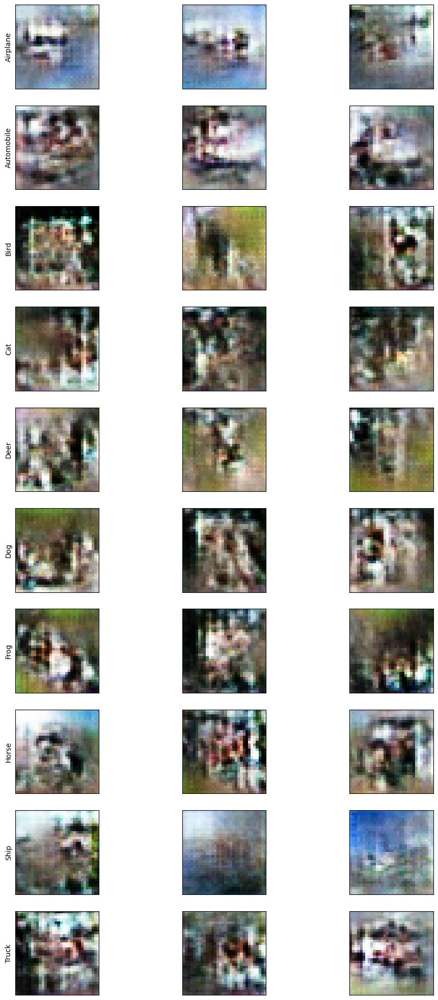

Epoch: 1 -- Generator Loss: 0.8302159309387207, Discriminator Loss: 1.3235646486282349

Took 164.23826360702515 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:03<00:00, 49.29it/s]


1/1 [==============================] - 0s 22ms/step


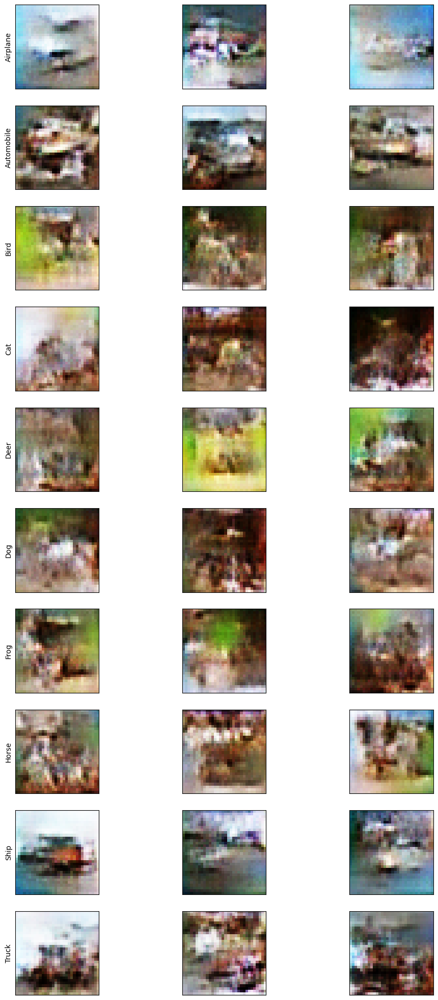

Epoch: 2 -- Generator Loss: 0.8472944498062134, Discriminator Loss: 1.303613305091858

Took 65.39875435829163 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:05<00:00, 47.99it/s]


1/1 [==============================] - 0s 26ms/step


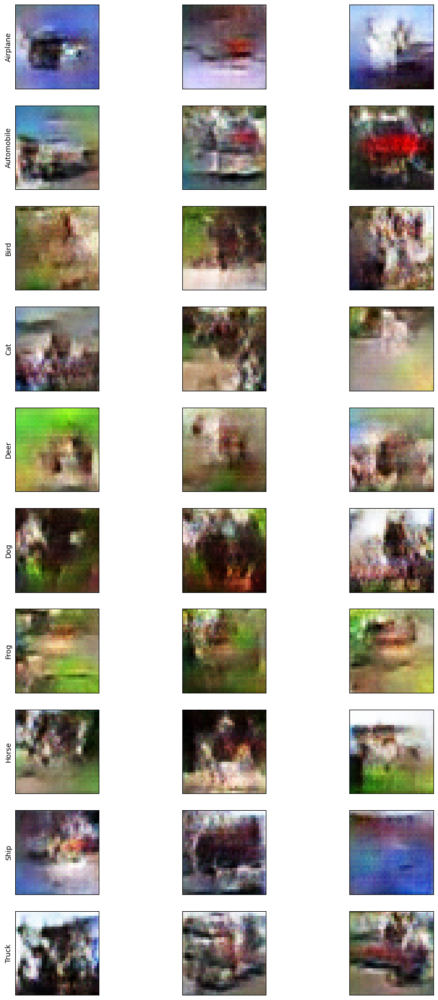

Epoch: 3 -- Generator Loss: 0.8106441497802734, Discriminator Loss: 1.3337239027023315

Took 67.48159837722778 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:02<00:00, 49.92it/s]


1/1 [==============================] - 0s 35ms/step


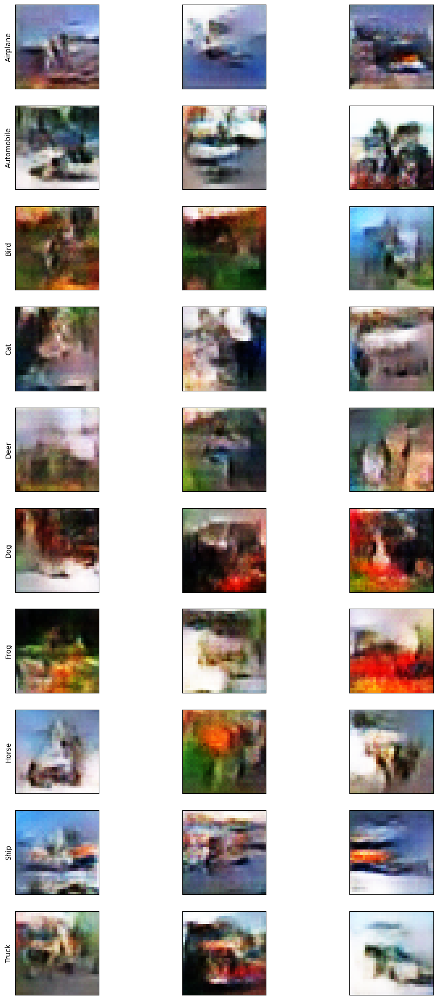

Epoch: 4 -- Generator Loss: 0.7853980660438538, Discriminator Loss: 1.3485578298568726

Took 65.02605319023132 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:03<00:00, 49.13it/s]


1/1 [==============================] - 0s 31ms/step


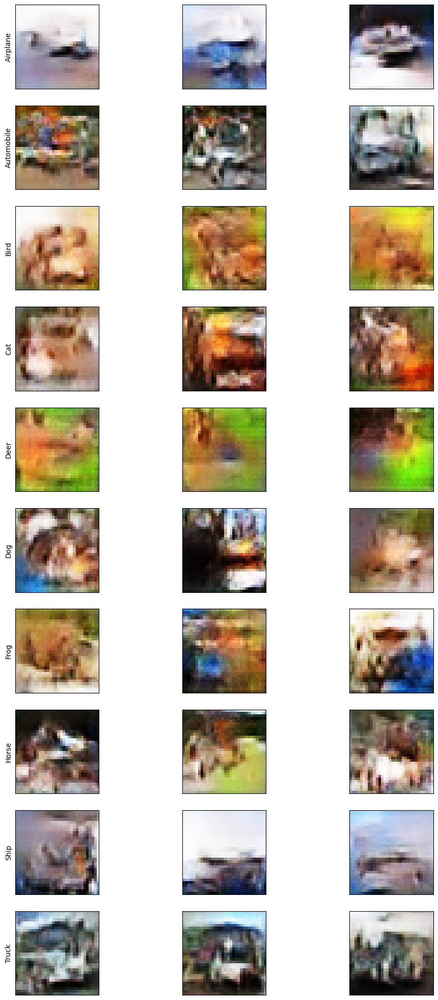

Epoch: 5 -- Generator Loss: 0.7767842411994934, Discriminator Loss: 1.3541566133499146

Took 66.1464433670044 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:02<00:00, 50.05it/s]


1/1 [==============================] - 0s 18ms/step


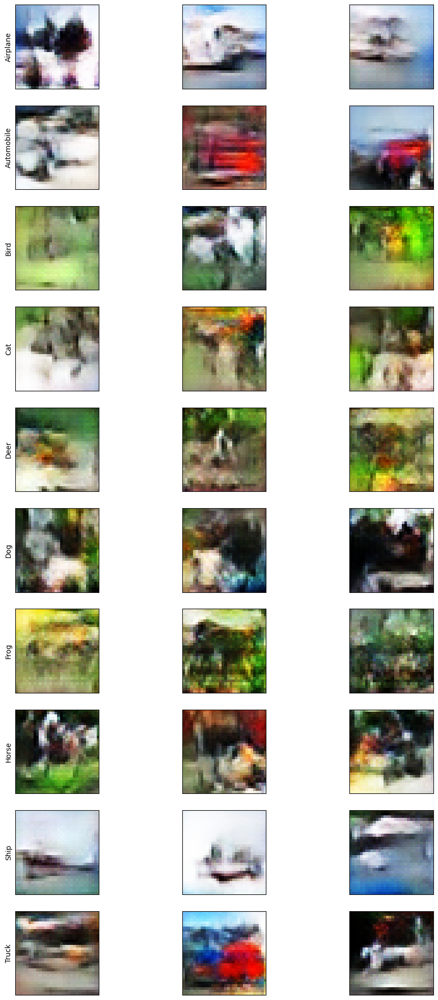

Epoch: 6 -- Generator Loss: 0.7721390128135681, Discriminator Loss: 1.3573553562164307

Took 64.71955251693726 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:02<00:00, 49.84it/s]


1/1 [==============================] - 0s 31ms/step


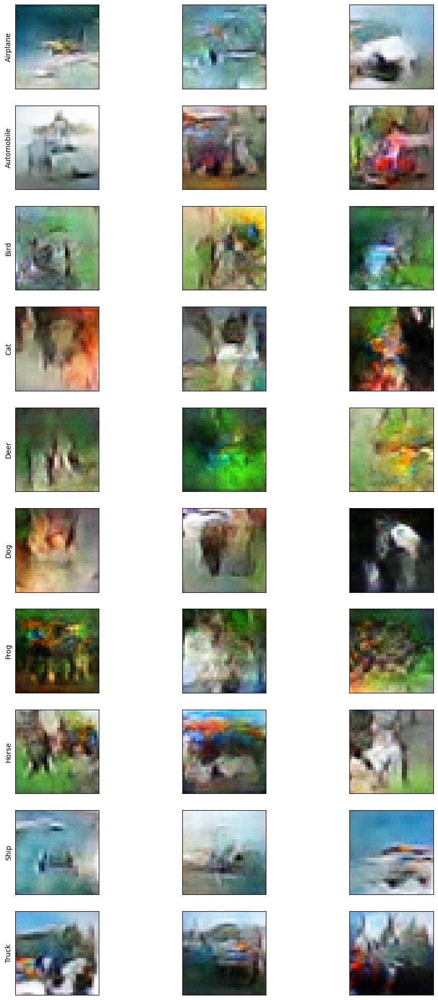

Epoch: 7 -- Generator Loss: 0.7696496844291687, Discriminator Loss: 1.3578648567199707

Took 65.14207124710083 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:02<00:00, 49.61it/s]


1/1 [==============================] - 0s 18ms/step


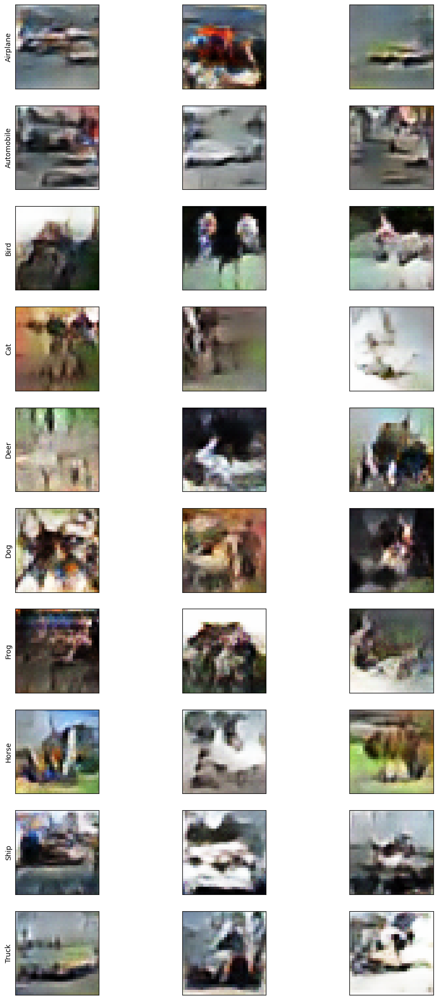

Epoch: 8 -- Generator Loss: 0.773185133934021, Discriminator Loss: 1.3515263795852661

Took 65.5191969871521 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:02<00:00, 49.84it/s]


1/1 [==============================] - 0s 21ms/step


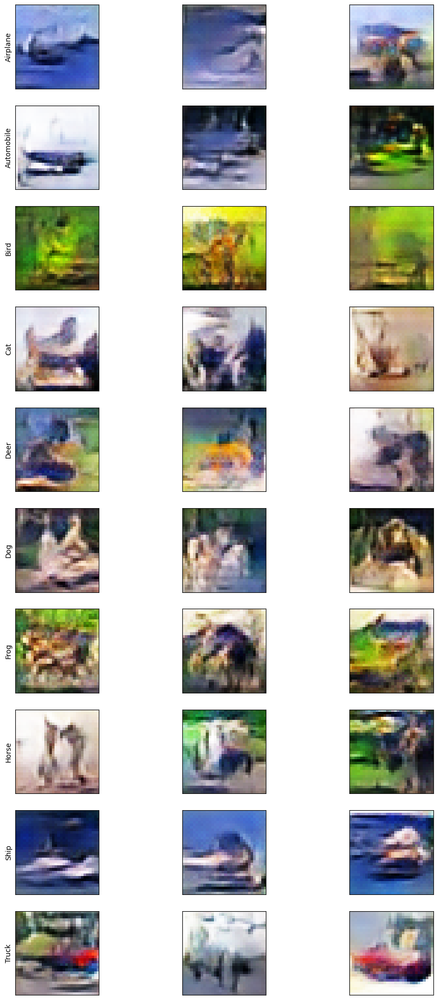

Epoch: 9 -- Generator Loss: 0.7747524976730347, Discriminator Loss: 1.35037362575531

Took 65.09141445159912 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:02<00:00, 49.89it/s]


1/1 [==============================] - 0s 16ms/step


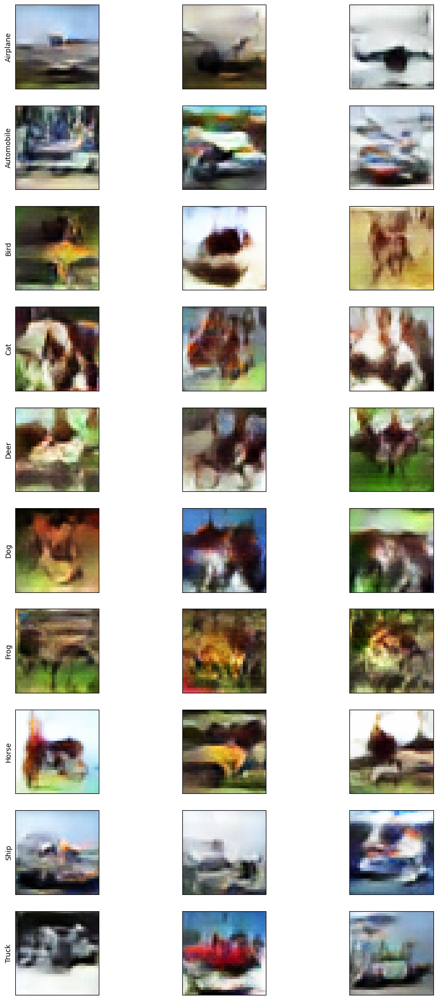

Epoch: 10 -- Generator Loss: 0.777935802936554, Discriminator Loss: 1.3484559059143066

Took 64.79585719108582 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:04<00:00, 48.65it/s]


1/1 [==============================] - 0s 34ms/step


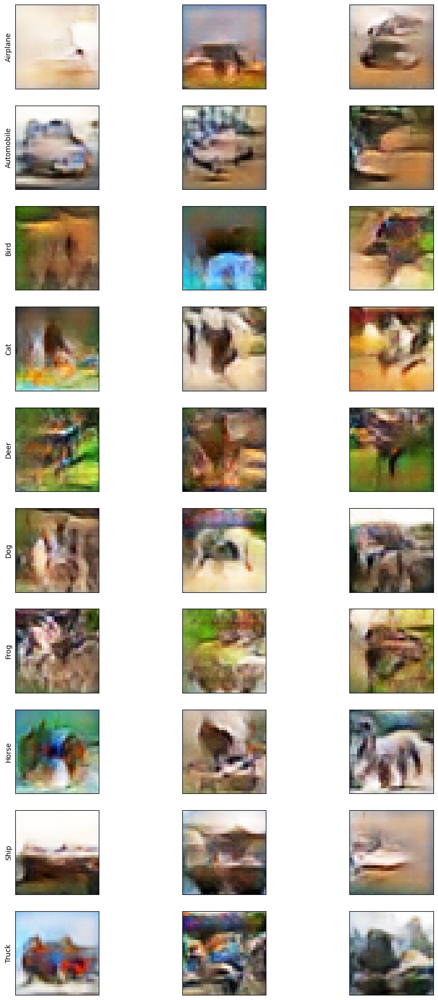

Epoch: 11 -- Generator Loss: 0.7727615833282471, Discriminator Loss: 1.3503477573394775

Took 66.59528183937073 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:05<00:00, 47.81it/s]


1/1 [==============================] - 0s 28ms/step


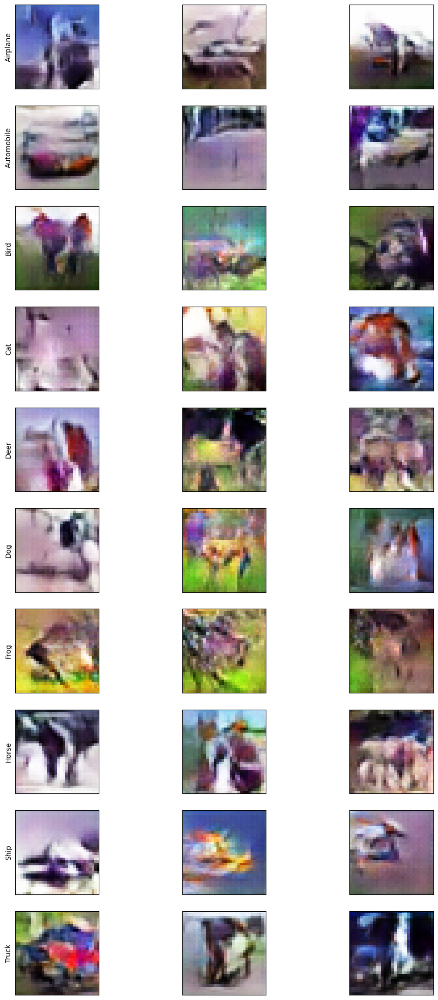

Epoch: 12 -- Generator Loss: 0.7731415629386902, Discriminator Loss: 1.3513973951339722

Took 68.01089811325073 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:05<00:00, 47.52it/s]


1/1 [==============================] - 0s 24ms/step


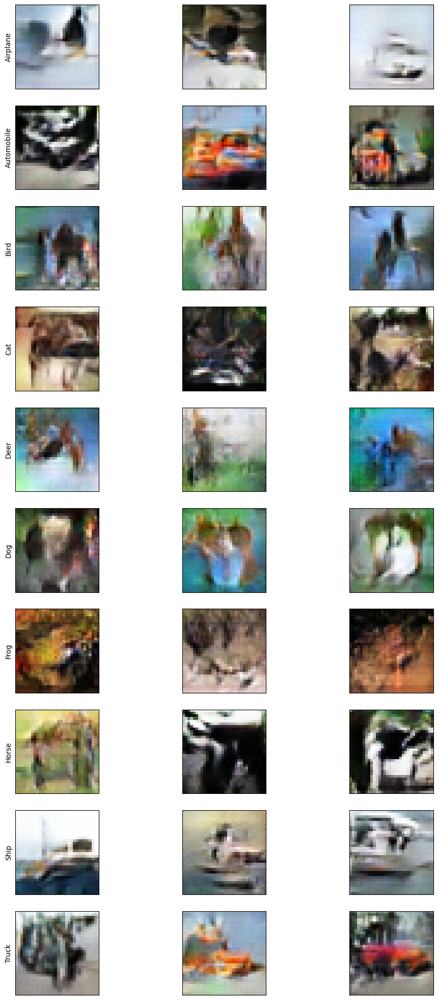

Epoch: 13 -- Generator Loss: 0.7706071138381958, Discriminator Loss: 1.3541699647903442

Took 68.5227837562561 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:03<00:00, 48.95it/s]


1/1 [==============================] - 0s 22ms/step


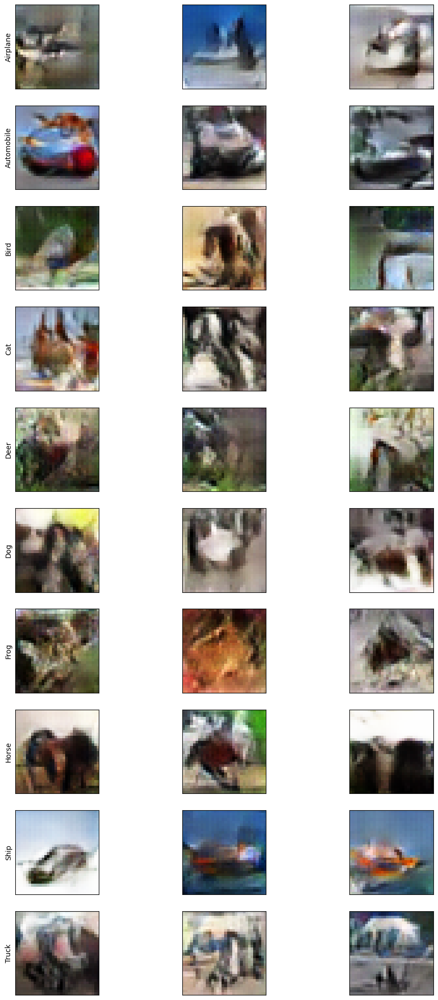

Epoch: 14 -- Generator Loss: 0.7682049870491028, Discriminator Loss: 1.3548191785812378

Took 66.13979458808899 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:04<00:00, 48.80it/s]


1/1 [==============================] - 0s 21ms/step


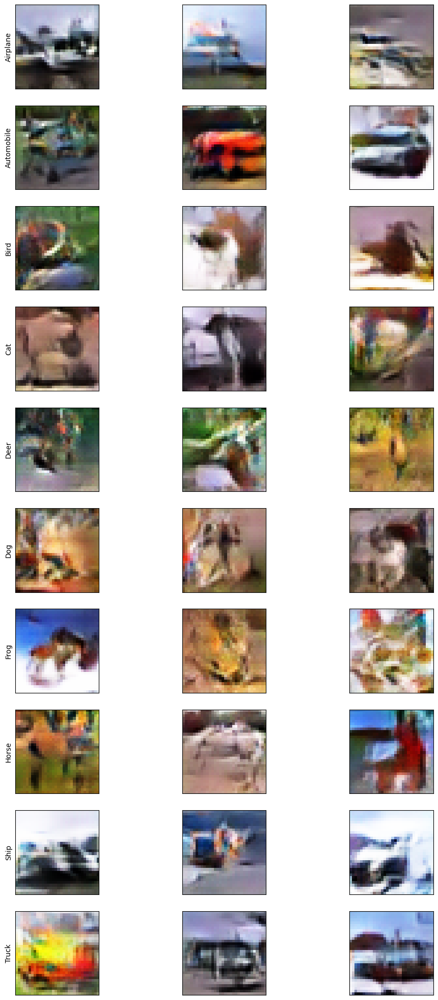

Epoch: 15 -- Generator Loss: 0.7663672566413879, Discriminator Loss: 1.3559956550598145

Took 66.17800569534302 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:03<00:00, 49.08it/s]


1/1 [==============================] - 0s 26ms/step


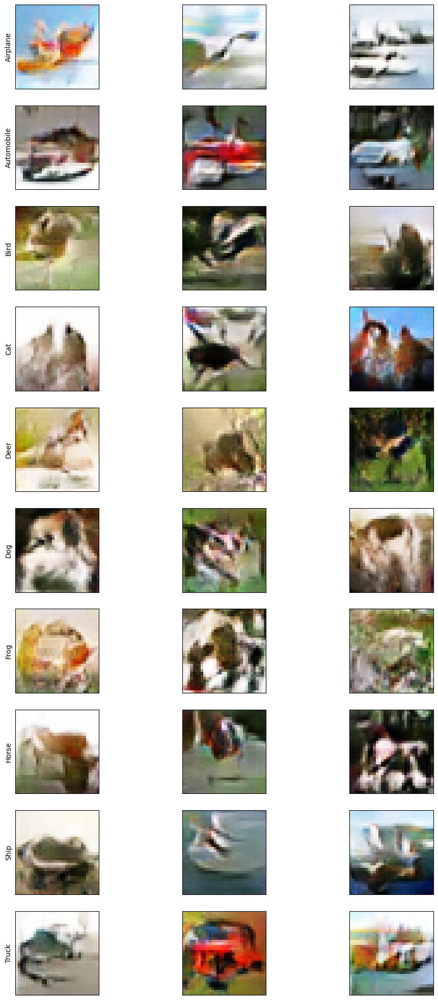

Epoch: 16 -- Generator Loss: 0.7641018629074097, Discriminator Loss: 1.3558484315872192

Took 66.09425210952759 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:03<00:00, 49.23it/s]


1/1 [==============================] - 0s 21ms/step


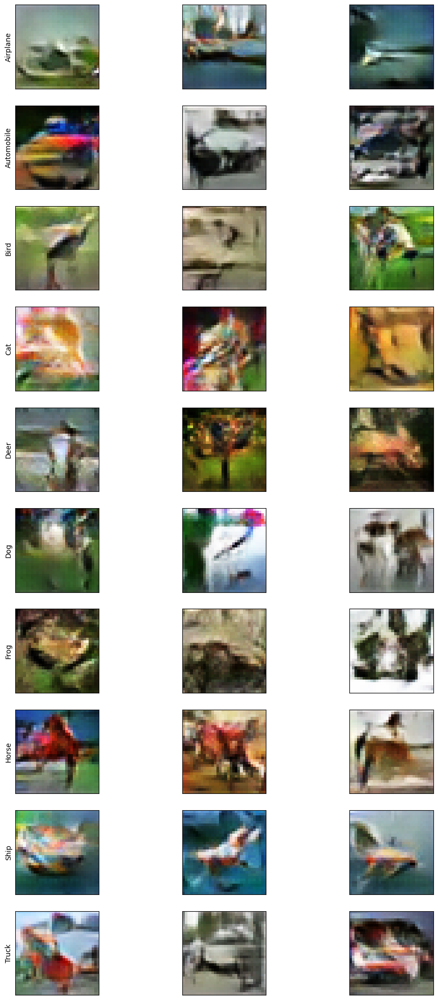

Epoch: 17 -- Generator Loss: 0.765792727470398, Discriminator Loss: 1.3544549942016602

Took 65.75960564613342 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:03<00:00, 49.20it/s]


1/1 [==============================] - 0s 26ms/step


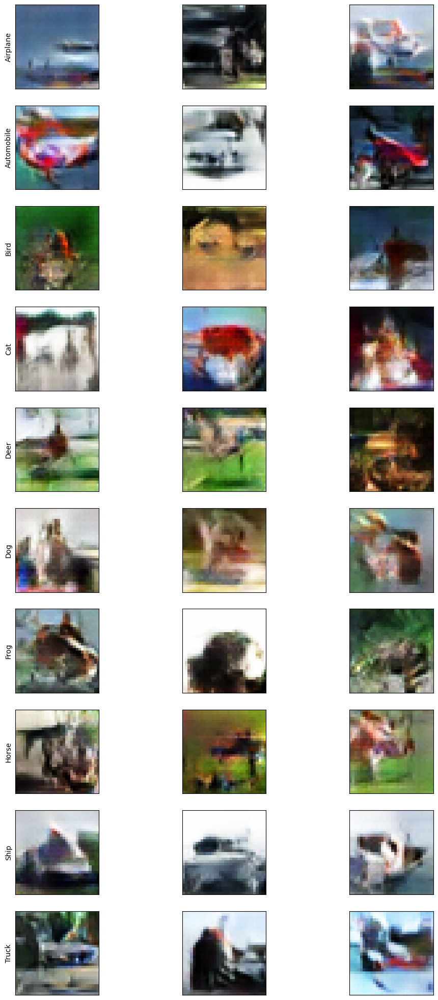

Epoch: 18 -- Generator Loss: 0.7660818696022034, Discriminator Loss: 1.354134202003479

Took 65.90339469909668 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:03<00:00, 48.95it/s]


1/1 [==============================] - 0s 33ms/step


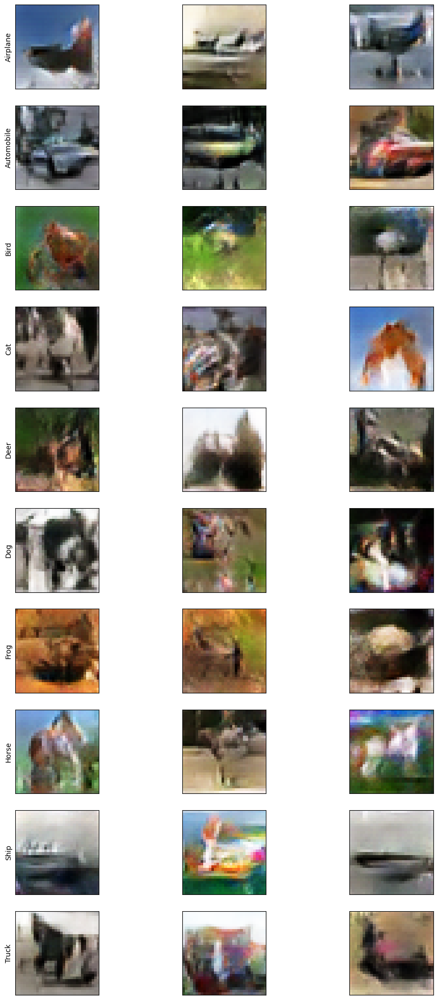

Epoch: 19 -- Generator Loss: 0.7678084373474121, Discriminator Loss: 1.354055643081665

Took 66.01735305786133 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:03<00:00, 49.17it/s]


1/1 [==============================] - 0s 23ms/step


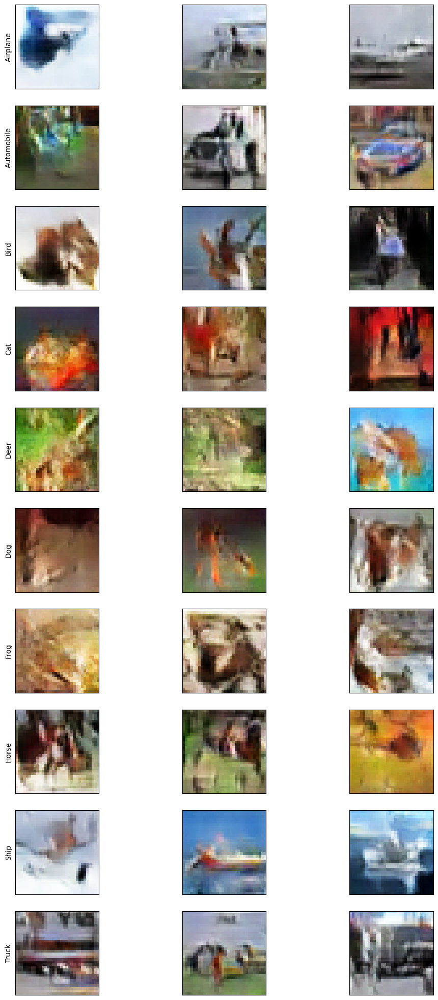

Epoch: 20 -- Generator Loss: 0.7675515413284302, Discriminator Loss: 1.3540908098220825

Took 65.98384761810303 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:03<00:00, 48.98it/s]


1/1 [==============================] - 0s 16ms/step


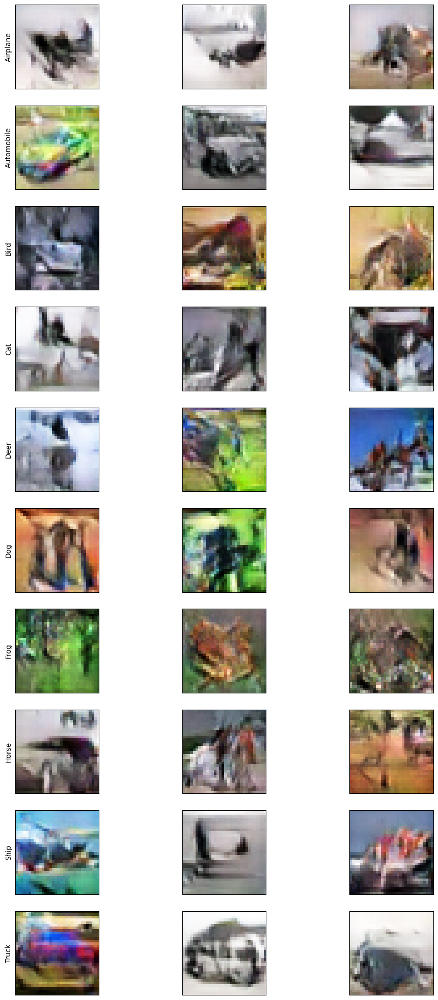

Epoch: 21 -- Generator Loss: 0.7698309421539307, Discriminator Loss: 1.3513164520263672

Took 66.25994229316711 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:03<00:00, 48.99it/s]


1/1 [==============================] - 0s 30ms/step


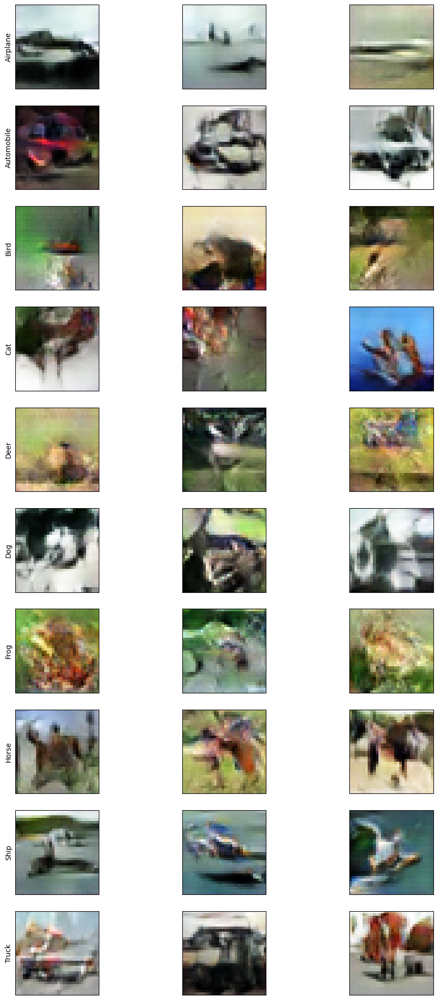

Epoch: 22 -- Generator Loss: 0.769128143787384, Discriminator Loss: 1.350983738899231

Took 66.18644738197327 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:03<00:00, 49.02it/s]


1/1 [==============================] - 0s 26ms/step


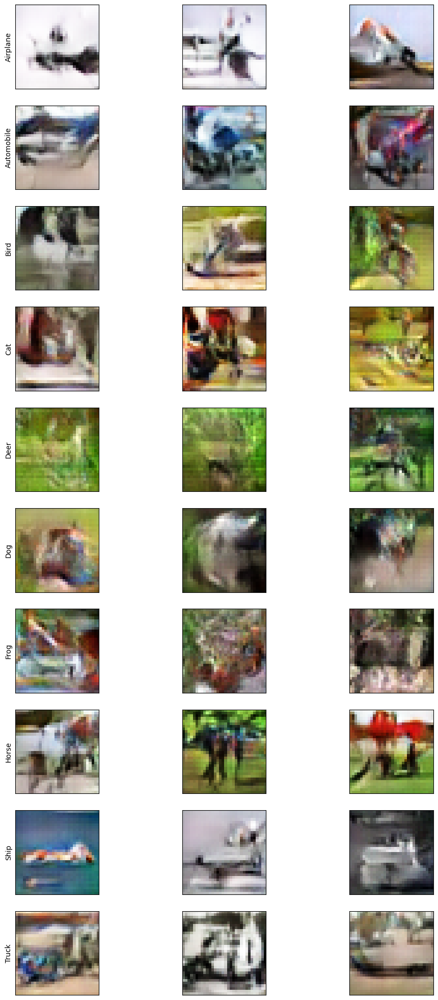

Epoch: 23 -- Generator Loss: 0.7707304954528809, Discriminator Loss: 1.3485819101333618

Took 66.33651733398438 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:03<00:00, 49.29it/s]


1/1 [==============================] - 0s 23ms/step


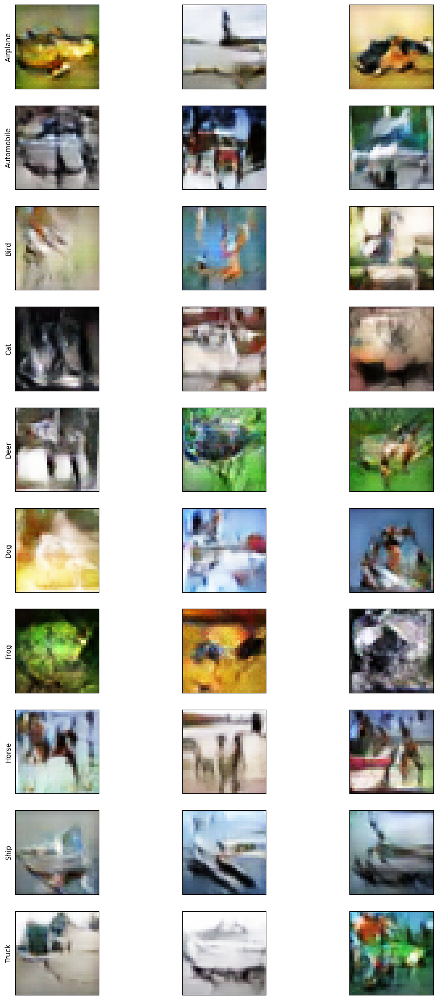

Epoch: 24 -- Generator Loss: 0.7704066634178162, Discriminator Loss: 1.3472177982330322

Took 65.47210240364075 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:03<00:00, 48.86it/s]


1/1 [==============================] - 0s 25ms/step


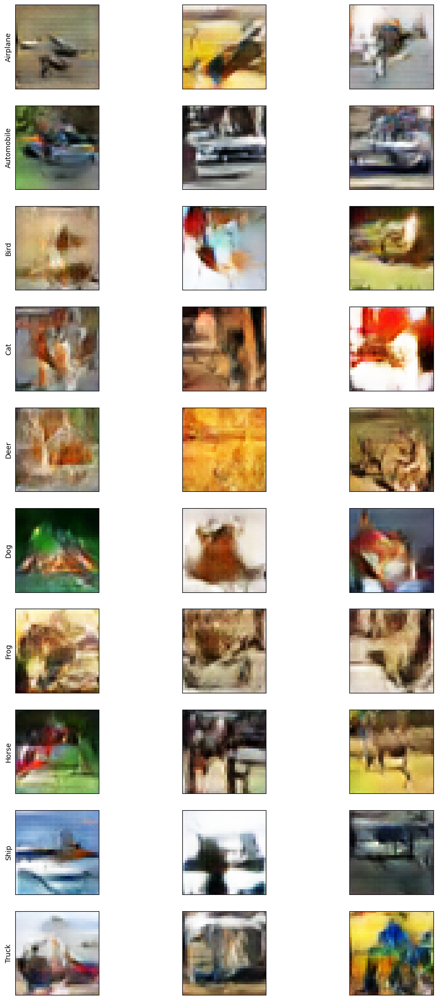

Epoch: 25 -- Generator Loss: 0.7737690806388855, Discriminator Loss: 1.3463881015777588

Took 66.42166543006897 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:11<00:00, 43.45it/s]


1/1 [==============================] - 0s 32ms/step


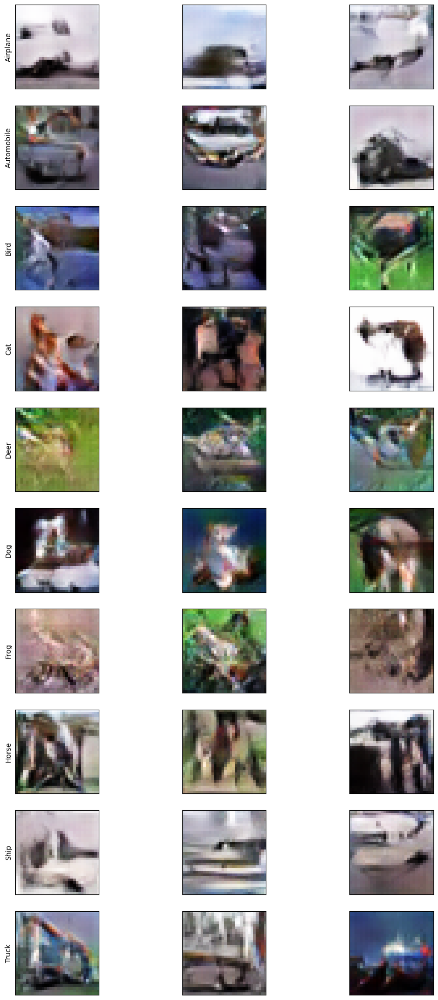

Epoch: 26 -- Generator Loss: 0.7767658829689026, Discriminator Loss: 1.345229983329773

Took 74.37425541877747 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:04<00:00, 48.32it/s]


1/1 [==============================] - 0s 35ms/step


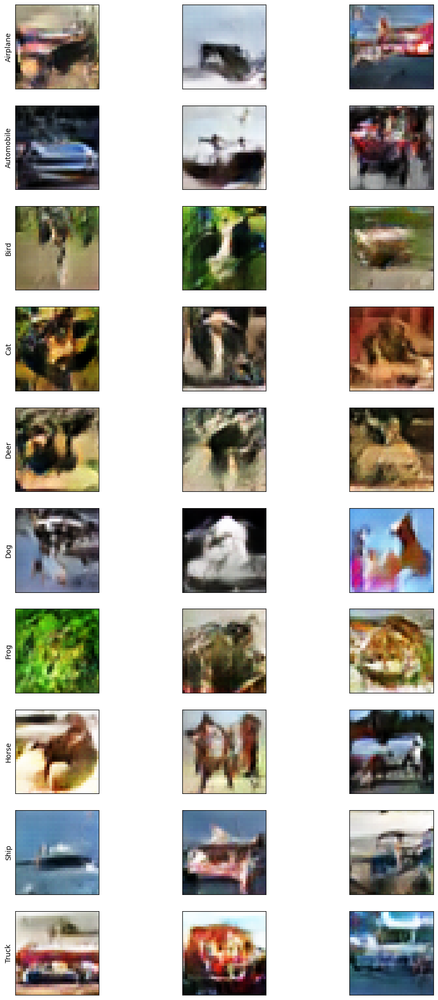

Epoch: 27 -- Generator Loss: 0.7788820862770081, Discriminator Loss: 1.342825174331665

Took 67.16178321838379 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:04<00:00, 48.69it/s]


1/1 [==============================] - 0s 41ms/step


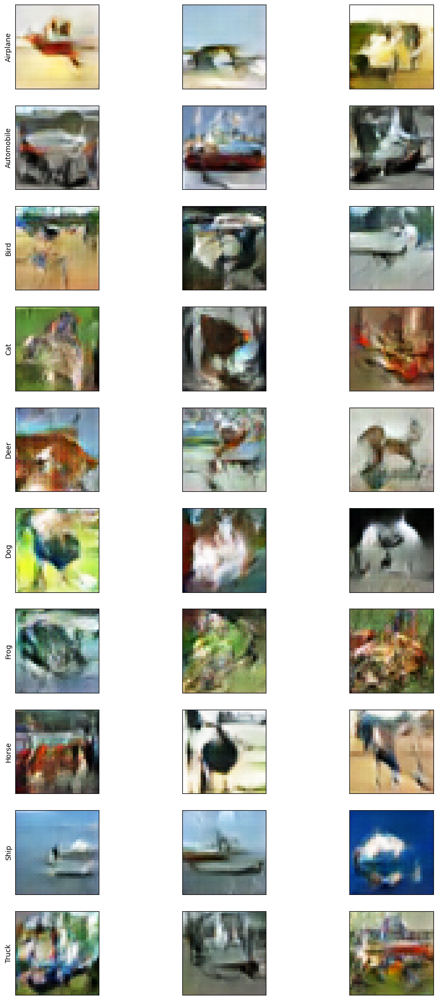

Epoch: 28 -- Generator Loss: 0.780914843082428, Discriminator Loss: 1.3408725261688232

Took 66.50637912750244 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:17<00:00, 40.15it/s]


1/1 [==============================] - 0s 42ms/step


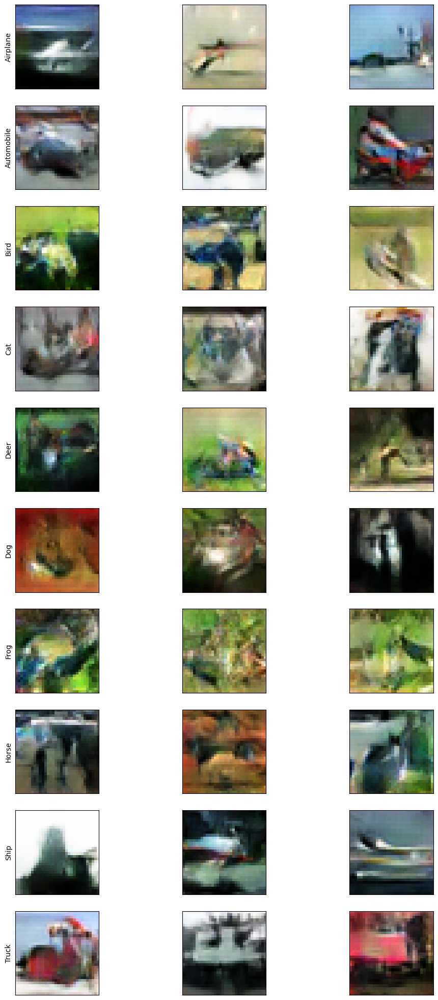

Epoch: 29 -- Generator Loss: 0.7830060720443726, Discriminator Loss: 1.3388278484344482

Took 83.59641408920288 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:19<00:00, 39.30it/s]


1/1 [==============================] - 0s 30ms/step


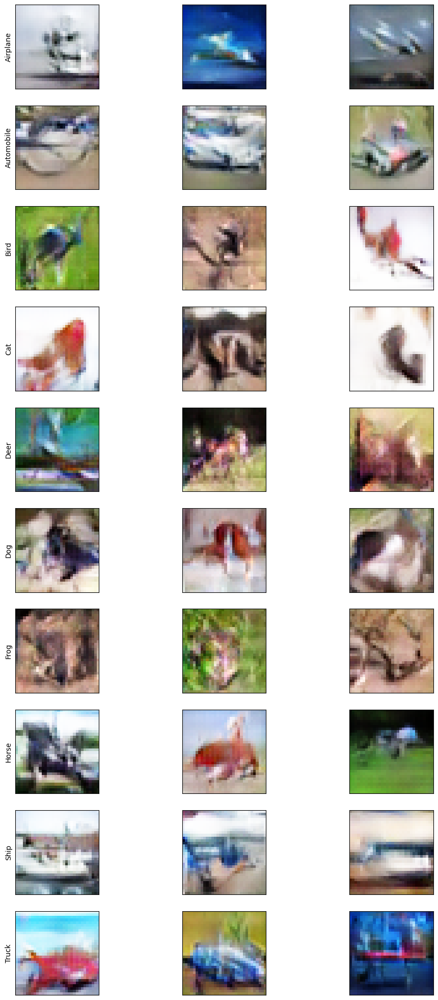

Epoch: 30 -- Generator Loss: 0.7861047387123108, Discriminator Loss: 1.3365856409072876

Took 84.09441637992859 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:05<00:00, 47.58it/s]


1/1 [==============================] - 0s 39ms/step


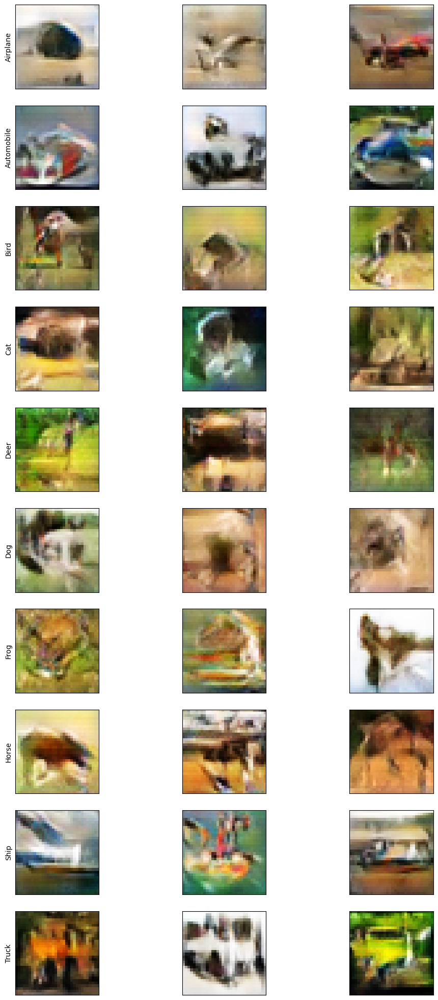

Epoch: 31 -- Generator Loss: 0.7882627248764038, Discriminator Loss: 1.334618091583252

Took 68.05014753341675 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:04<00:00, 48.45it/s]


1/1 [==============================] - 0s 32ms/step


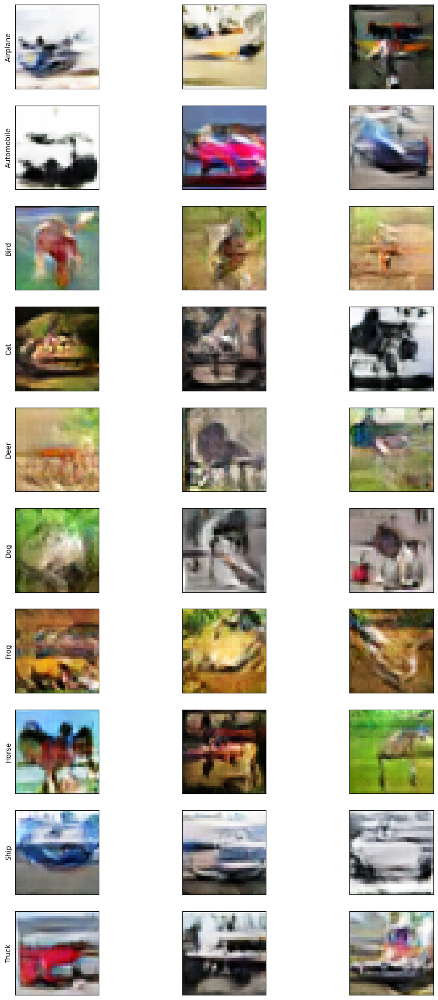

Epoch: 32 -- Generator Loss: 0.7901996374130249, Discriminator Loss: 1.3346641063690186

Took 67.05834579467773 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:04<00:00, 48.13it/s]


1/1 [==============================] - 0s 34ms/step


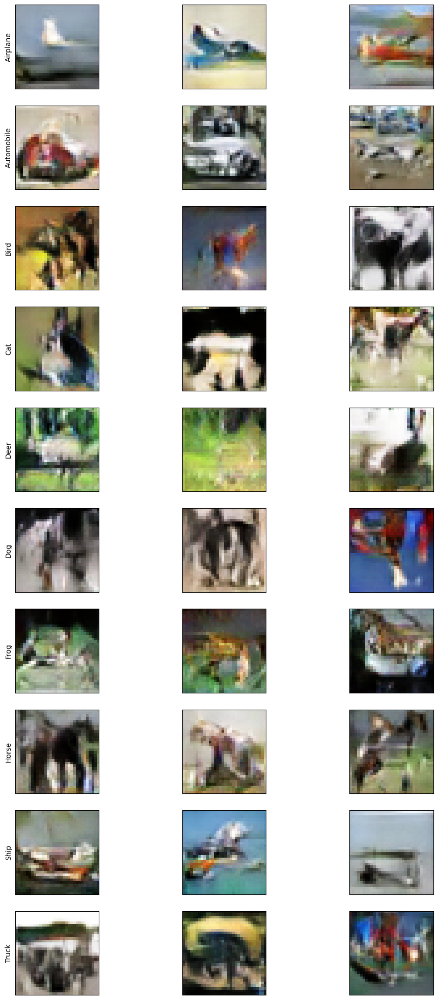

Epoch: 33 -- Generator Loss: 0.7929798364639282, Discriminator Loss: 1.3330531120300293

Took 67.11960411071777 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:04<00:00, 48.75it/s]


1/1 [==============================] - 0s 29ms/step


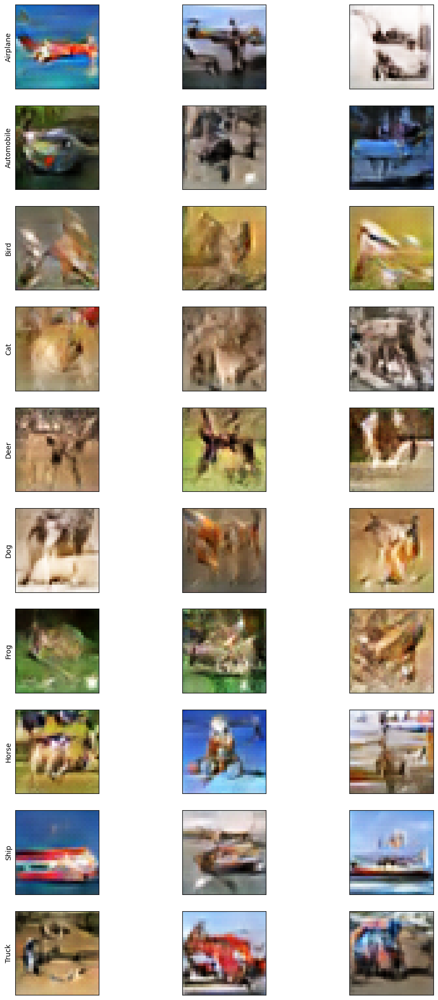

Epoch: 34 -- Generator Loss: 0.7964860200881958, Discriminator Loss: 1.3301184177398682

Took 66.52938437461853 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:05<00:00, 47.89it/s]


1/1 [==============================] - 0s 29ms/step


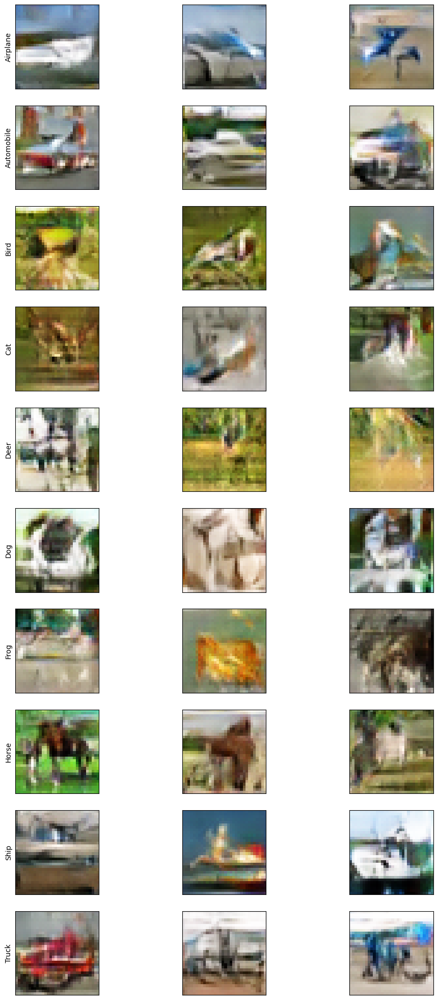

Epoch: 35 -- Generator Loss: 0.7976285219192505, Discriminator Loss: 1.3282577991485596

Took 67.50928235054016 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:04<00:00, 48.35it/s]


1/1 [==============================] - 0s 37ms/step


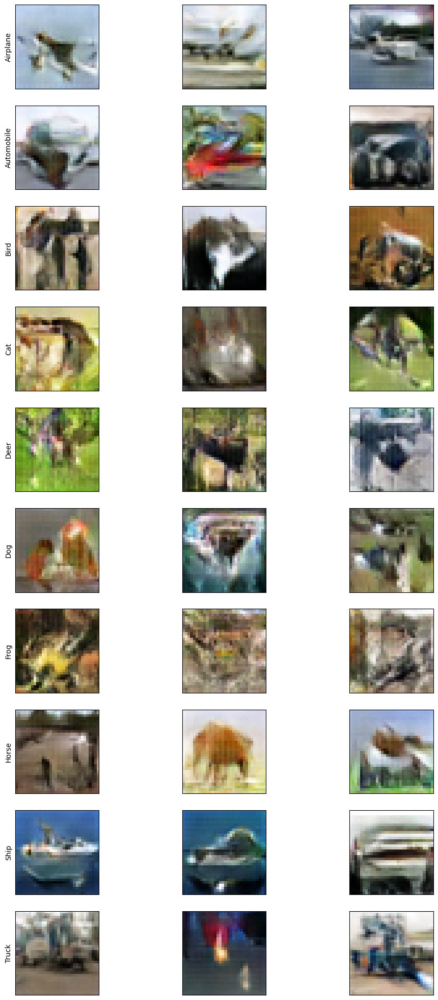

Epoch: 36 -- Generator Loss: 0.7990137338638306, Discriminator Loss: 1.3271777629852295

Took 66.95174980163574 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:03<00:00, 49.05it/s]


1/1 [==============================] - 0s 22ms/step


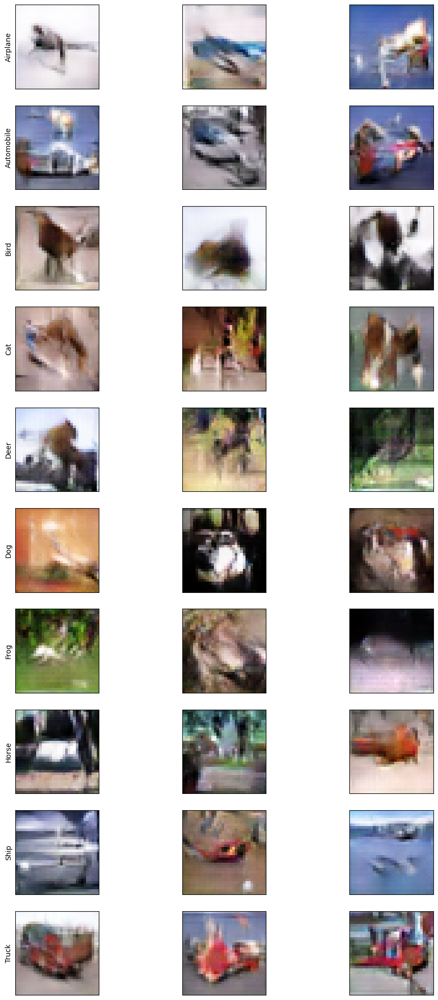

Epoch: 37 -- Generator Loss: 0.7974663972854614, Discriminator Loss: 1.324927806854248

Took 65.73208332061768 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:03<00:00, 49.09it/s]


1/1 [==============================] - 0s 22ms/step


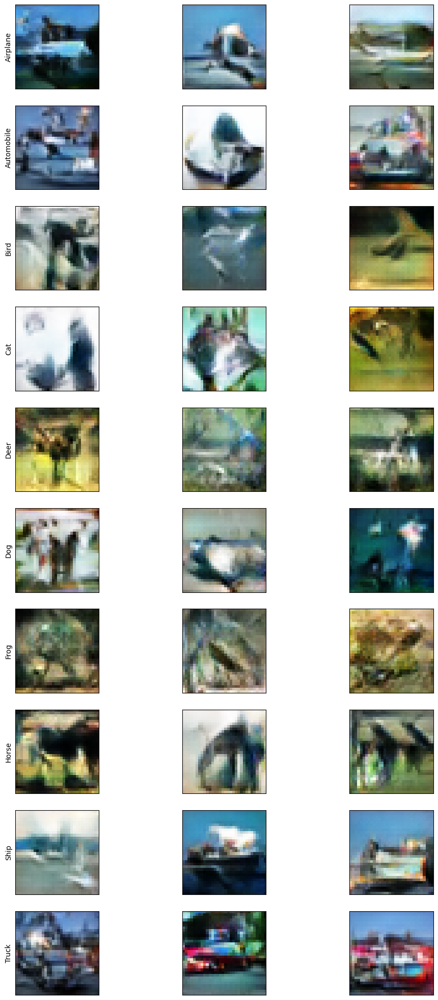

Epoch: 38 -- Generator Loss: 0.8040241599082947, Discriminator Loss: 1.3230918645858765

Took 65.81004643440247 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:03<00:00, 49.21it/s]


1/1 [==============================] - 0s 27ms/step


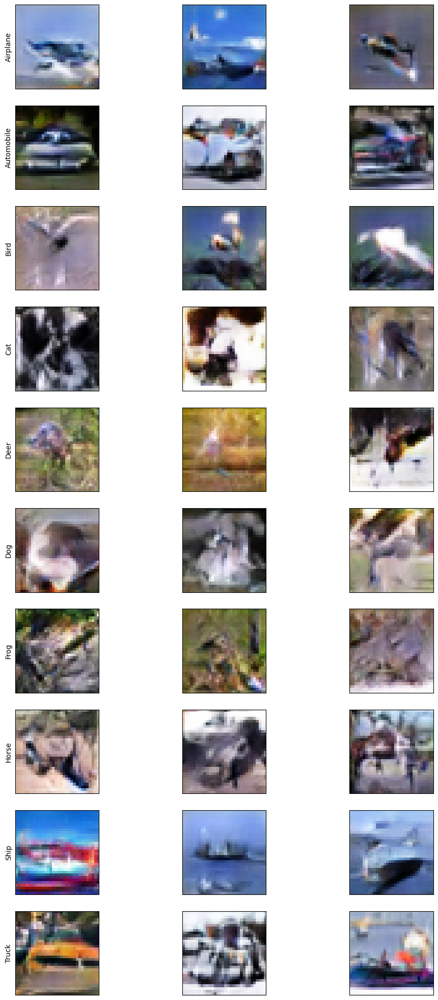

Epoch: 39 -- Generator Loss: 0.8071526288986206, Discriminator Loss: 1.3231509923934937

Took 65.77560997009277 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:03<00:00, 49.23it/s]


1/1 [==============================] - 0s 23ms/step


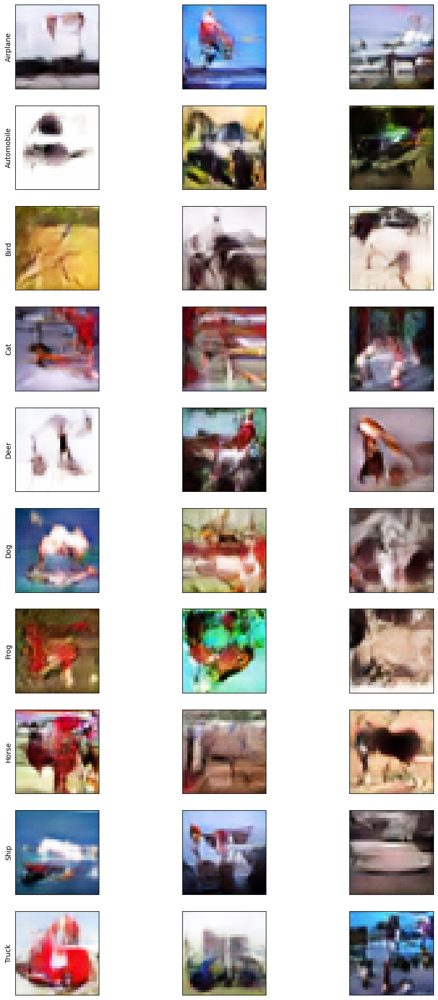

Epoch: 40 -- Generator Loss: 0.8071715831756592, Discriminator Loss: 1.3199150562286377

Took 65.67007327079773 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:03<00:00, 49.29it/s]


1/1 [==============================] - 0s 21ms/step


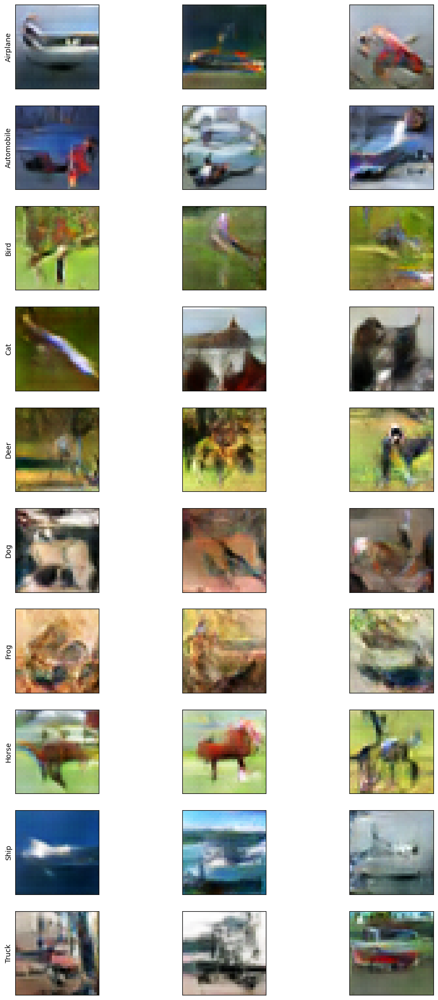

Epoch: 41 -- Generator Loss: 0.8145173192024231, Discriminator Loss: 1.3177183866500854

Took 65.3519401550293 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [03:33<00:00, 14.63it/s] 


1/1 [==============================] - 0s 21ms/step


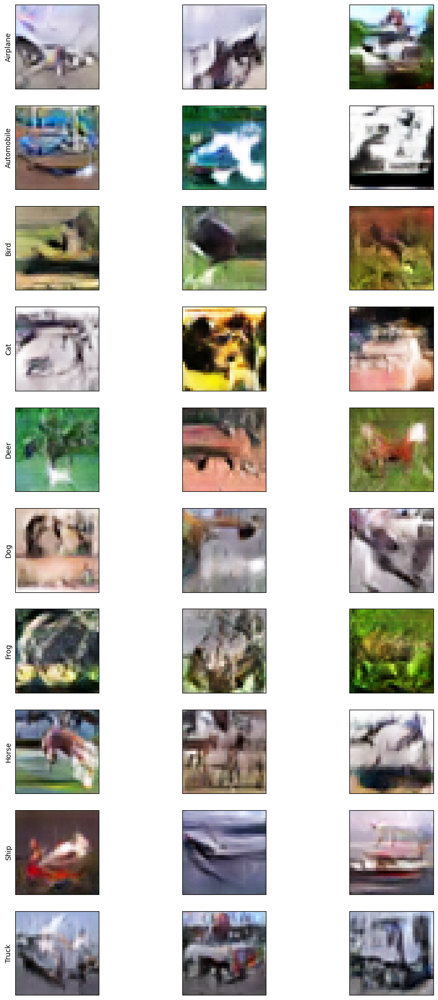

Epoch: 42 -- Generator Loss: 0.8139834403991699, Discriminator Loss: 1.318237543106079

Took 215.74721479415894 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:03<00:00, 49.09it/s]


1/1 [==============================] - 0s 22ms/step


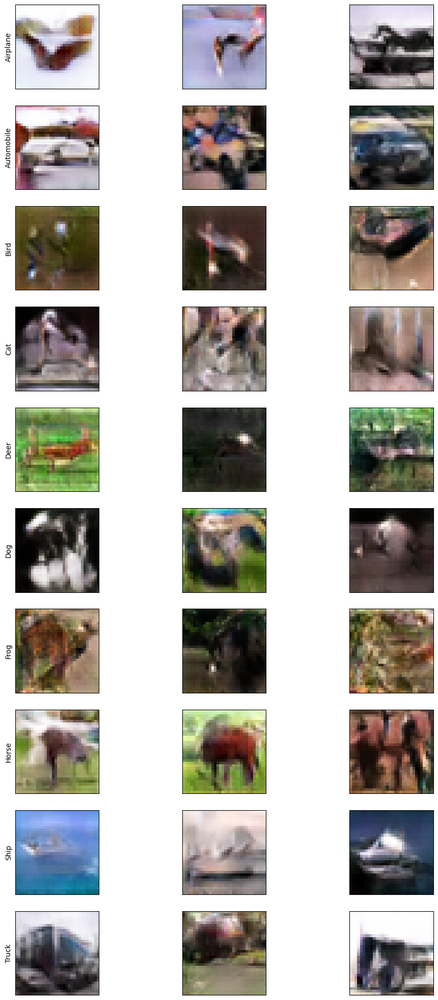

Epoch: 43 -- Generator Loss: 0.8146474957466125, Discriminator Loss: 1.3142434358596802

Took 65.81667137145996 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:04<00:00, 48.62it/s]


1/1 [==============================] - 0s 39ms/step


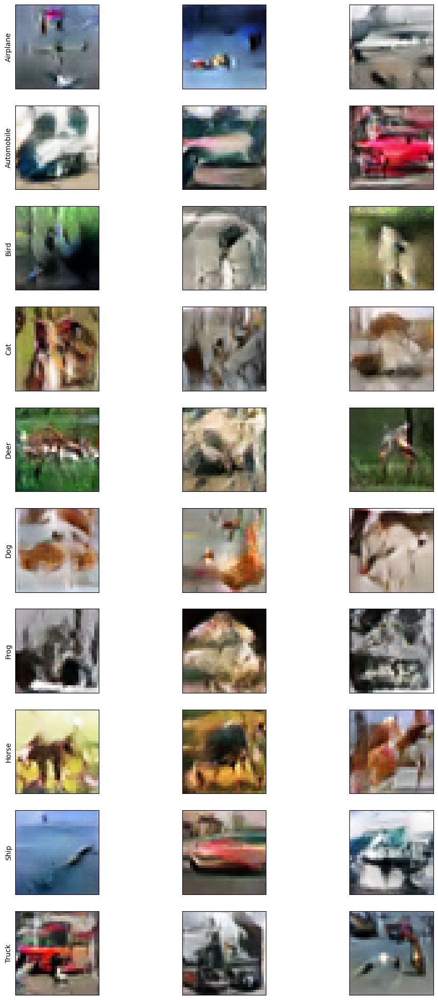

Epoch: 44 -- Generator Loss: 0.8186020255088806, Discriminator Loss: 1.311795949935913

Took 66.58509945869446 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:05<00:00, 47.98it/s]


1/1 [==============================] - 0s 28ms/step


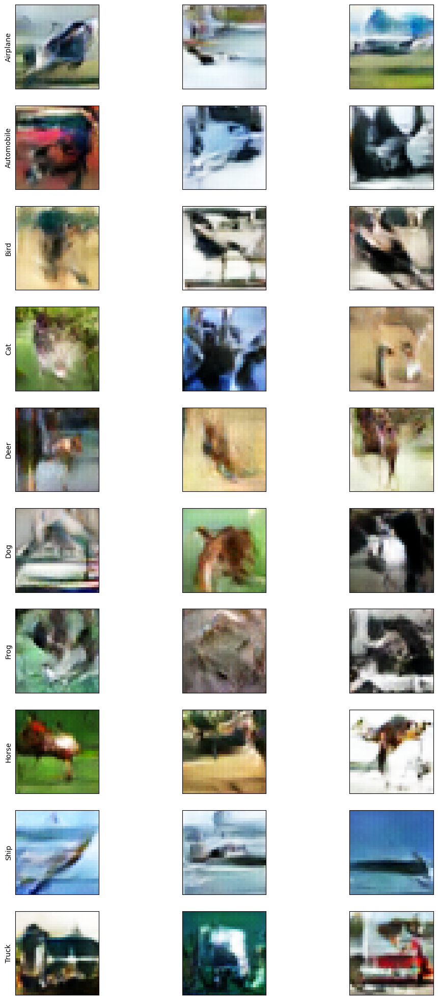

Epoch: 45 -- Generator Loss: 0.8210989236831665, Discriminator Loss: 1.3105891942977905

Took 67.27657508850098 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:05<00:00, 47.70it/s]


1/1 [==============================] - 0s 19ms/step


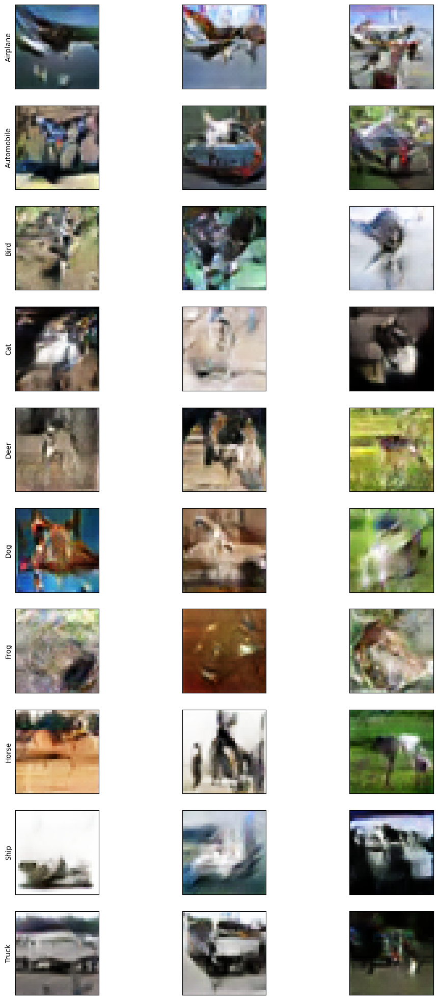

Epoch: 46 -- Generator Loss: 0.8218268752098083, Discriminator Loss: 1.310328483581543

Took 67.9996690750122 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:10<00:00, 44.37it/s]


1/1 [==============================] - 0s 25ms/step


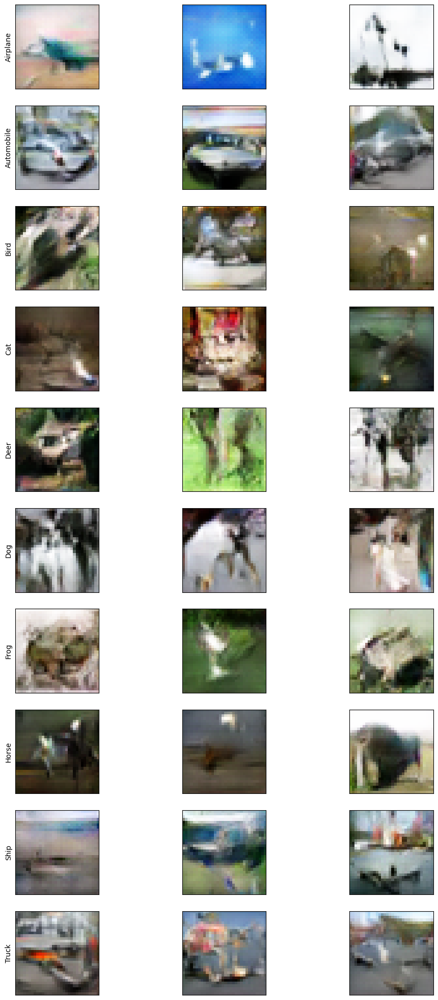

Epoch: 47 -- Generator Loss: 0.8295767307281494, Discriminator Loss: 1.3074334859848022

Took 72.8321533203125 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:10<00:00, 44.59it/s]


1/1 [==============================] - 0s 25ms/step


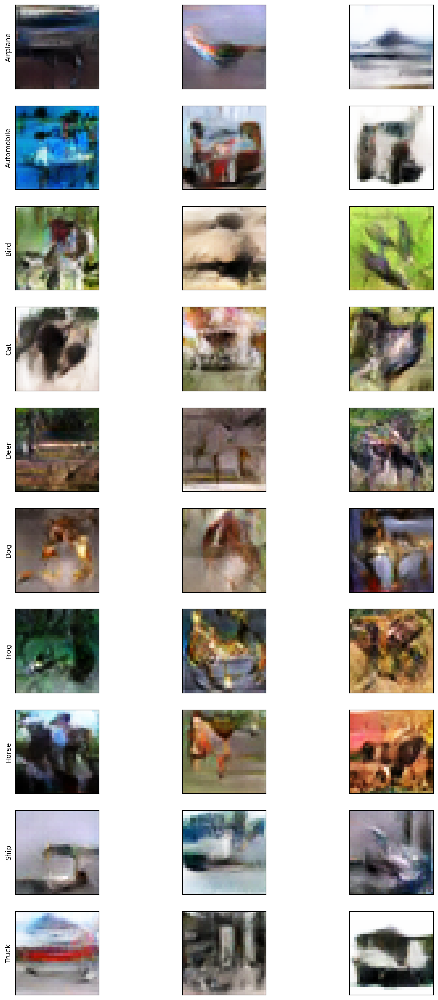

Epoch: 48 -- Generator Loss: 0.8295722007751465, Discriminator Loss: 1.3070712089538574

Took 72.20350480079651 seconds. 


Epoch:  50


100%|██████████| 3125/3125 [01:05<00:00, 47.46it/s]


1/1 [==============================] - 0s 23ms/step


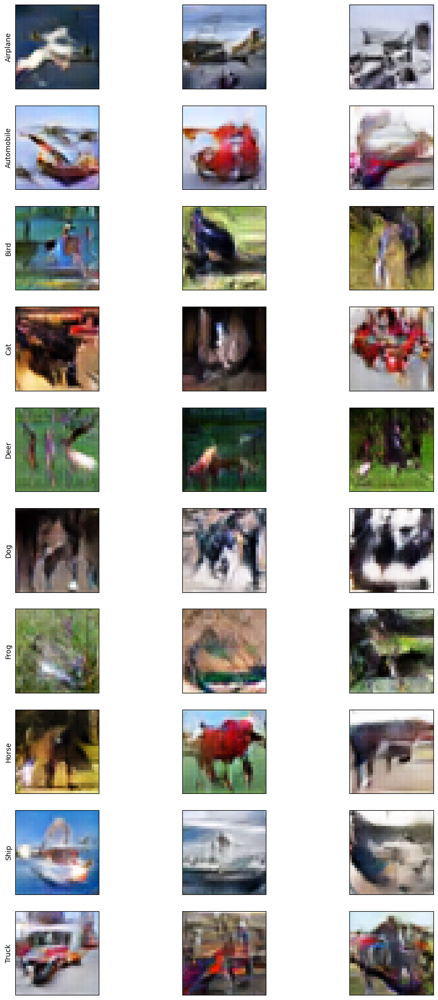

Epoch: 49 -- Generator Loss: 0.8321222066879272, Discriminator Loss: 1.303598165512085

Took 68.03704953193665 seconds. 




In [26]:
def train(dataset, epochs=epoch_count):
	for epoch in range(epochs):
		print('Epoch: ', epochs)
		d_loss_list = []
		g_loss_list = []
		q_loss_list = []
		start = time.time()
		
		itern = 0
		for image_batch in tqdm(dataset):
			d_loss, g_loss = train_step(image_batch)
			d_loss_list.append(d_loss)
			g_loss_list.append(g_loss)
			itern=itern+1
				
		show_samples(3, n_class, g_model)
			
		print (f'Epoch: {epoch} -- Generator Loss: {np.mean(g_loss_list)}, Discriminator Loss: {np.mean(d_loss_list)}\n')
		print (f'Took {time.time()-start} seconds. \n\n')
		
		
train(dataset, epochs=epoch_count)